In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
import cv2
from sklearn import mixture
from sklearn.metrics import confusion_matrix
from helpers import ImageManager
from skimage.feature import local_binary_pattern

In [2]:
np.random.seed(7)

In [3]:
# Get Data using the Helper Class
mng = ImageManager()
training = dict()
testing = dict()
testing["images"] = mng.get_testing_images(co)
training["images"] = mng.get_training_images()
_, testing["bounds"] = mng.update_testing_bounds()
_, training["bounds"] = mng.update_training_bounds()

### Note that this notebook was run on Windows, some differences were noticied when run on Linux, even after fixing the seed and sorting the images. However, runs are consistent among Windows and Linux users separately.

In [4]:
K = 15

In [5]:
def sift_feats(imgs_dict, K, draw = False, clf=None):
    """
    Computes and adds sift for a list images
    """
  
    images = imgs_dict["images"]
    bounds = imgs_dict["bounds"]
    
    num_imgs_per_person = int(len(images)/5)

    sift_feats = []

    if(draw):
        plt.figure(figsize=(20, 70))
    
    for i, img in enumerate(images):

        img_disp = img.copy()

        # create a SIFT object
        sift = cv2.xfeatures2d.SIFT_create()

        # detect SIFT features, with no masks
        keypoints = sift.detect(img, None)
        
        # Filter images inside the drawn rectangle
        keypoints_filtered = []
        for kp in keypoints:
            point = kp.pt;
            if(point[0] > bounds[i]["min_x"] and 
               point[0] < bounds[i]["max_x"] and 
               point[1] > bounds[i]["min_y"] and 
               point[1] < bounds[i]["max_y"]):
                keypoints_filtered.append(kp)

        keypoints = keypoints_filtered

        # compute SIFT descriptors
        keypoints, descriptors = sift.compute(img, keypoints)

        feats_dict = {"keypoints": keypoints, "descriptors" : descriptors}

        sift_feats.append(feats_dict)

        # draw the keypoints
        cv2.drawKeypoints(img, keypoints, img_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

        if(draw):
            # display images
            plt.subplot(num_imgs_per_person, 5, (math.floor(i/num_imgs_per_person) + 1 + 5 * (i % num_imgs_per_person)))
            plt.imshow(img_disp)

    
    plt.show()
    
    return sift_feats, clf

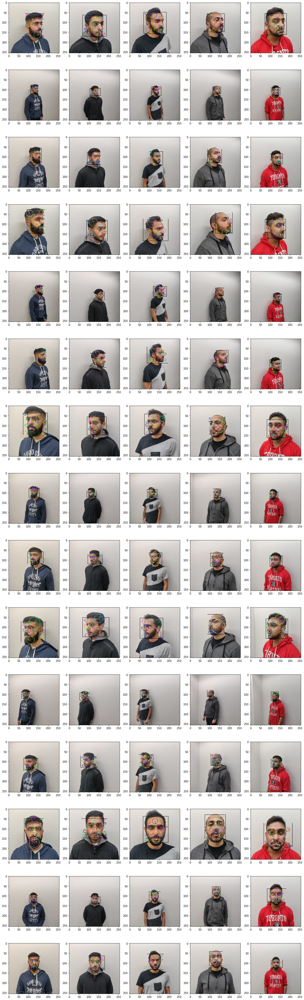

In [6]:
training["sift"], gmm_clf = sift_feats(training, K, draw = True)

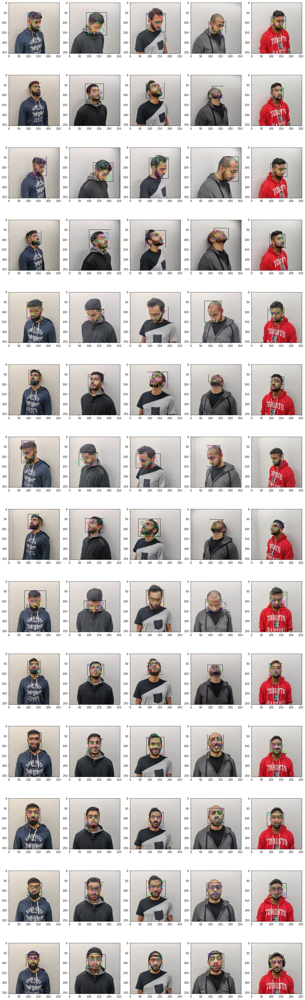

In [7]:
testing["sift"], _ = sift_feats(testing, K, draw = True, clf=gmm_clf)

In [8]:
def difference(hist_1, hist_2):
    """
    Calculates euclidean distance between 2 histograms
    """
    hist_1 = np.array(hist_1)
    hist_2= np.array(hist_2)
    diff = np.linalg.norm(hist_1 - hist_2)
    return diff

In [9]:
def hog_features(images, cell_size=3, block_size=2, nbins=9):
    """
    Finds hog features for a list of images
    """
    features = []
    
    for img in images:
        w = img.shape[0]
        h = img.shape[1]
        h_cells = h // cell_size
        w_cells = w // cell_size
        n_cells = (w_cells, h_cells)
        
        # create HoG Object
        hog = cv2.HOGDescriptor(_winSize=(h_cells * cell_size, w_cells * cell_size),
                                _blockSize=(block_size * cell_size, block_size * cell_size),
                                _blockStride=(cell_size, cell_size),
                                _cellSize=(cell_size, cell_size),
                                _nbins=nbins)

        # Compute HoG features
        hog_feats = hog.compute(img).reshape(h_cells - block_size + 1,
                                             w_cells - block_size + 1,
                                             block_size, block_size,
                                             nbins).transpose((1, 0, 3, 2, 4))
        hog_feats = hog_feats.flatten()
        features.append(hog_feats)
        
    return np.array(features)

In [10]:
def get_identities(histogram_test, histogram_train):
    """
    Get identities of users
    """
    identities = []
    for j, _h_test in enumerate(histogram_test):
        closest_idx = 0
        min_diff = 1000
        diff = 0
        for i, _h_train in enumerate(histogram_train):
            diff = difference(_h_train, _h_test)
            if(diff < min_diff):
                min_diff = diff
                closest_idx = i

        if(closest_idx >= 0 and closest_idx < 15):
            identities.append("Abdullah")
        elif(closest_idx >= 15 and closest_idx < 30):
            identities.append("Mustafa")
        elif(closest_idx >= 30 and closest_idx < 45):
            identities.append("Saleh")
        elif(closest_idx >= 45 and closest_idx < 60):
            identities.append("Adham")
        else:
            identities.append("Anees")
    return identities

In [11]:
def calculate_recog_rate(identities):
    """
    Calculates Recognition Rate
    """
    ids = ["Abdullah", "Mustafa", "Saleh", "Adham", "Anees"]

    true_ids = []
    for ID in ids:
        for i in range(14):
            true_ids.append(ID)

    correct = 0
    for i in range(70):
        correct += identities[i] == true_ids[i]
    
    rate = correct/70*100
    
    print('Recoginition Rate: {:.3f}%'.format(rate))
    return rate, true_ids

In [12]:
def BoW(cell_size_list, k, clf=None):
    """
    Fits a GMM model on given data and distributes it into histograms (BoW)
    """
    fit_list = []
    hog_patches = []
    for person in cell_size_list:
        for image in person:
            fit_list.append(image)
            for patch_hog in image:
                hog_patches.append(patch_hog)
    fit_list = np.array(fit_list)   

    if clf is None:
        clf = mixture.GaussianMixture(n_components = K, covariance_type='tied', random_state=7)
        # fit GMM on train data
        clf.fit(hog_patches);
    
    # predict cluster membership from the fitted GMM 
    labels = []
    for img in fit_list:
        labels.append(clf.predict(img))
    
    histograms = []
    for _label in labels:
        freq = []
        for _k in range(k):
            freq.append(np.count_nonzero(_label == _k))
        histograms.append(freq/np.linalg.norm(freq))
    
    # Plot
    plt.figure(figsize=(20, 5))
    for i in range(3):
        plt.subplot(1, 3, i + 1)
        plt.bar(range(K), histograms[i], edgecolor='k' )
        plt.xlim([-1, K]) # set x-axis limit
    plt.show()
    
    return histograms, clf

In [13]:
def get_features(training, testing, train_dict, test_dict, feature = 'sift', extractor='HOG', patch_size=15):
    """
    Returns the features given a certain keypoint, feature extraction, and patch size
    """
    for size in train_dict.keys():
        imgs_test = []
        imgs_train = []
        for j in range(int(len(training['images'])/15)):  # 5
            feats_per_person = []

            for i in range(15 * j, (15 * j) + 15):
                img = training['images'][i]
                
                if(feature == 'sift'):
                    # Extract 15x15 around each keypoint
                    img_crop_train = []
                    for kp in training['sift'][i]["keypoints"]:
                        min_y = int(kp.pt[1] - patch_size//2)
                        max_y = int(kp.pt[1] + patch_size//2)
                        min_x = int(kp.pt[0] - patch_size//2)
                        max_x = int(kp.pt[0] + patch_size//2)

                        img_crop_train.append(cv2.cvtColor(img[min_y:max_y, min_x:max_x], cv2.COLOR_RGB2GRAY))
                else:
                    # Extract 15x15 around each keypoint
                    img_crop_train = []
                    for kp in training['harris corners'][i]:
                        min_y = int(kp[1] - patch_size//2)
                        max_y = int(kp[1] + patch_size//2)
                        min_x = int(kp[0] - patch_size//2)
                        max_x = int(kp[0] + patch_size//2)

                        img_crop_train.append(cv2.cvtColor(img[min_y:max_y, min_x:max_x], cv2.COLOR_RGB2GRAY))
                        
                if extractor == 'HOG':
                    feats_per_img = (hog_features(np.array(img_crop_train),cell_size=size))
                elif extractor == 'LBP':
                    feats_per_img = lbp_features(np.array(img_crop_train),size)

                feats_per_img = feats_per_img.reshape(len(feats_per_img),-1)
                feats_per_person.append(feats_per_img)

            imgs_train.append(feats_per_person)


        # Get Testing Images KP + HoG feats
        for j in range(int(len(testing['images'])/14)):  # 5

            feats_per_person = []

            for i in range((14 * j), (14 * j) + 14):
                img = testing['images'][i]
            
                if(feature == 'sift'):
                    # Extract 15x15 around each keypoint
                    img_crop_test = []
                    for kp in testing['sift'][i]["keypoints"]:
                        min_y = int(kp.pt[1] - patch_size//2)
                        max_y = int(kp.pt[1] + patch_size//2)
                        min_x = int(kp.pt[0] - patch_size//2)
                        max_x = int(kp.pt[0] + patch_size//2)

                        img_crop_test.append(cv2.cvtColor(img[min_y:max_y, min_x:max_x], cv2.COLOR_RGB2GRAY))

                else:
                    # Extract 15x15 around each keypoint
                    img_crop_test = []
                    for kp in testing['harris corners'][i]:
                        min_y = int(kp[1] - patch_size//2)
                        max_y = int(kp[1] + patch_size//2)
                        min_x = int(kp[0] - patch_size//2)
                        max_x = int(kp[0] + patch_size//2)

                        img_crop_test.append(cv2.cvtColor(img[min_y:max_y, min_x:max_x], cv2.COLOR_RGB2GRAY))
                        
                if extractor == 'HOG':
                    feats_per_img = (hog_features(np.array(img_crop_test),cell_size=size))
                elif extractor == 'LBP':
                    feats_per_img = lbp_features(np.array(img_crop_test),size)
                    
                feats_per_img = feats_per_img.reshape(len(feats_per_img),-1)
                feats_per_person.append(feats_per_img)

            imgs_test.append(feats_per_person)

        test_dict[size] = imgs_test
        train_dict[size] = imgs_train


## 4.3 Experiment 1: HoG

In [14]:
cell_sizes_train = {3: None, 4:None, 5:None}
cell_sizes_test = {3: None, 4: None, 5: None}

get_features(training, testing, cell_sizes_train, cell_sizes_test, extractor = 'HOG', patch_size = 15)

### Cell Size = 3x3

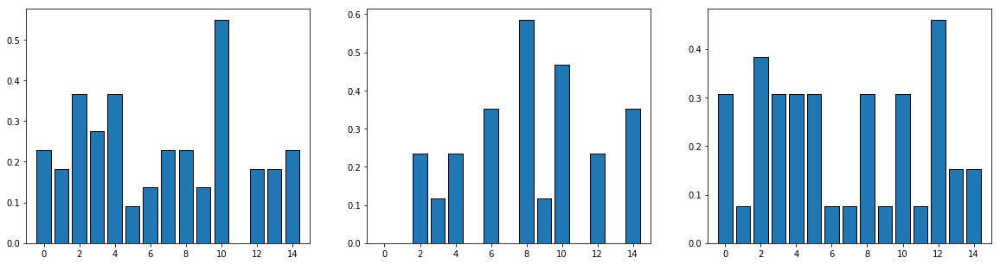

In [15]:
h_train, gmm_clf = BoW(cell_sizes_train[3], K, None)

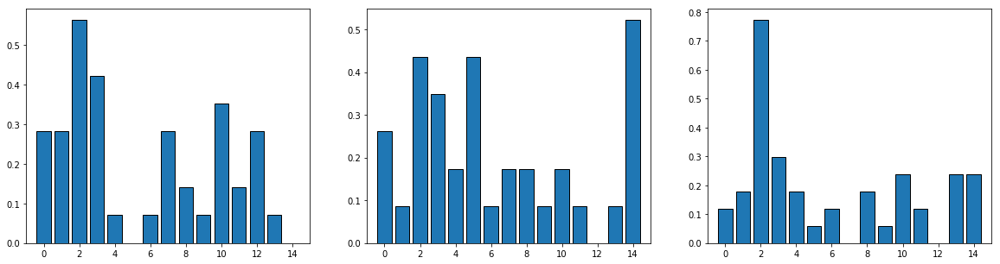

In [16]:
h_test, _ = BoW(cell_sizes_test[3], K, gmm_clf)

In [17]:
identities3 = get_identities(h_test, h_train)

In [18]:
rate_3, true_ids3 = calculate_recog_rate(identities3)

Recoginition Rate: 21.429%


### Cell Size = 4x4

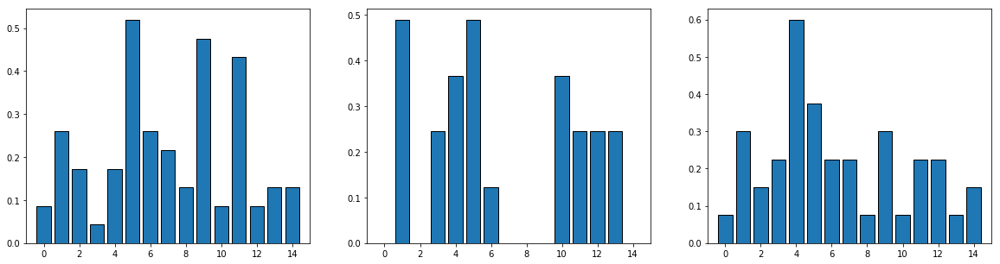

In [19]:
h_train, gmm_clf = BoW(cell_sizes_train[4], K, None)

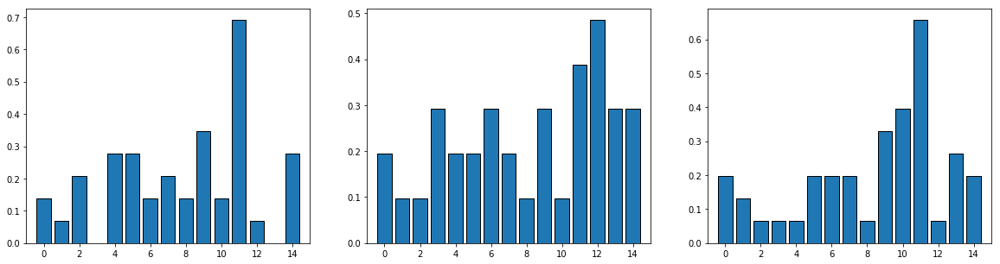

In [20]:
h_test, _ = BoW(cell_sizes_test[4], K, gmm_clf)

In [21]:
identities4 = get_identities(h_test, h_train)

In [22]:
rate_4, true_ids4 = calculate_recog_rate(identities4)

Recoginition Rate: 27.143%


### Cell Size = 5x5

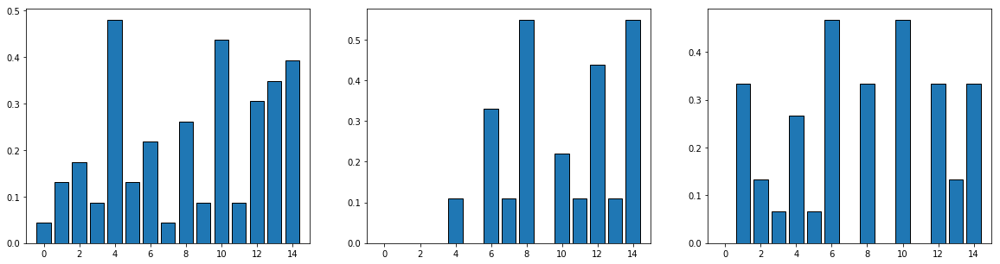

In [23]:
h_train, gmm_clf = BoW(cell_sizes_train[5], K, None)

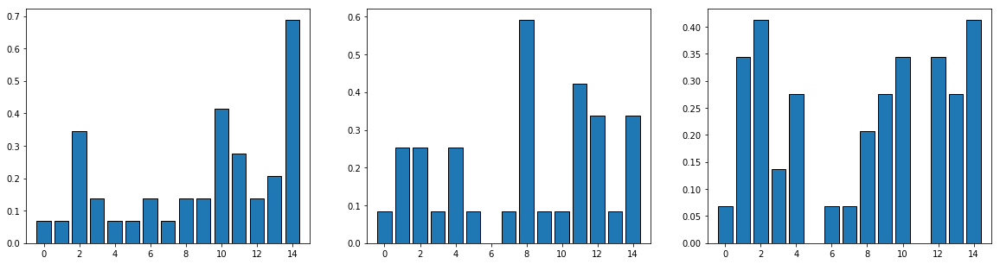

In [24]:
h_test, _ = BoW(cell_sizes_test[5], K, gmm_clf)

In [25]:
identities5 = get_identities(h_test, h_train)

In [26]:
rate_5, true_ids5 = calculate_recog_rate(identities5)

Recoginition Rate: 24.286%


### Plot recognition rate (on y-axis) vs patch size (on x-axis). Compute confusion matrix for the best performing vocabulary.

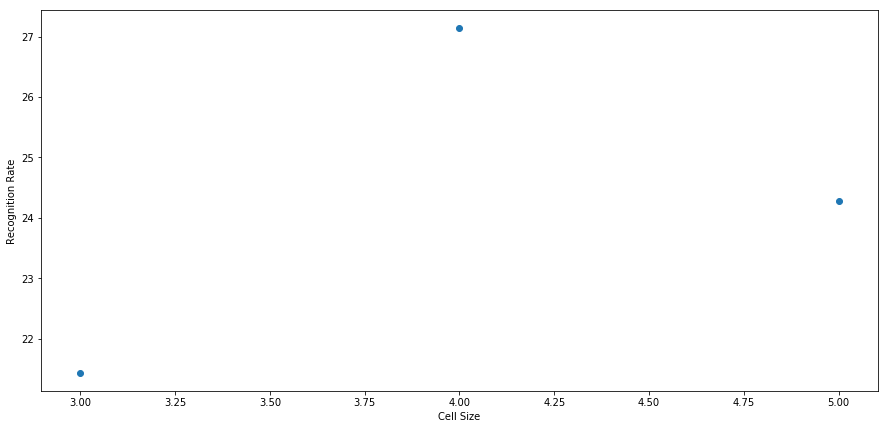

In [27]:
plt.figure(figsize=(15,7))
plt.scatter([3,4,5], [rate_3, rate_4, rate_5])
plt.ylabel('Recognition Rate')
plt.xlabel('Cell Size')
plt.show()

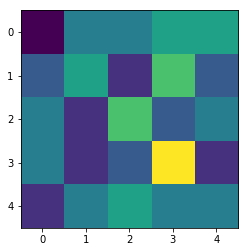

In [28]:
rates = [rate_3, rate_4, rate_5]
index = np.argmax(rates)
y_test = [true_ids3, true_ids4, true_ids5]
y_pred = [identities3, identities4, identities5]
plt.imshow(confusion_matrix(y_test[index], y_pred[index]))
plt.show()

## 4.1 Experiment 1: LBP

In [29]:
def lbp_features(images, radius):
    """
    Finds hog features for a list of images
    """
    features = []
    
    for img in images:
        
        lbp = local_binary_pattern(img, 8*radius, radius)
        lbp = lbp.flatten()
        features.append(lbp)
        
    return np.array(features)

In [30]:
"""
4.3 Experiment 1

Crop images after extracting sift keypoints then LBP of new cropped img

"""

radii_train = {2: None, 7:None, 12:None}
radii_test = {2: None, 7: None, 12: None}

get_features(training, testing, radii_train, radii_test, extractor = 'LBP', patch_size = 15)

### Radius = 2

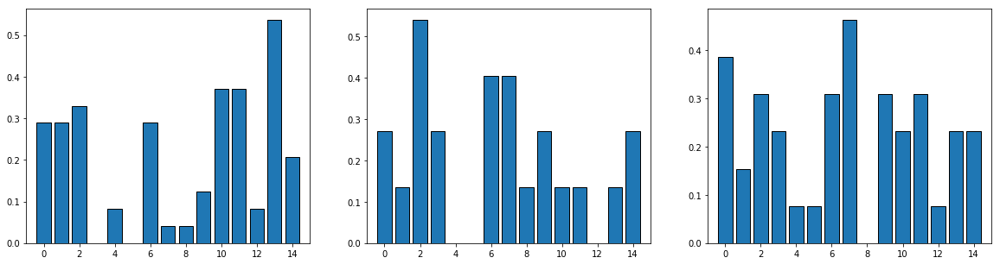

In [31]:
h_train, gmm_clf = BoW(radii_train[2], K, None)

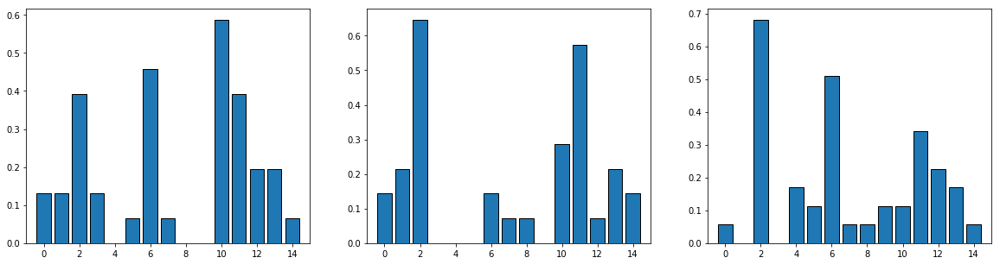

In [32]:
h_test, _ = BoW(radii_test[2], K, gmm_clf)

In [33]:
identities2 = get_identities(h_test, h_train)

In [34]:
rate_2, true_ids2 = calculate_recog_rate(identities2)

Recoginition Rate: 38.571%


### Radius = 7

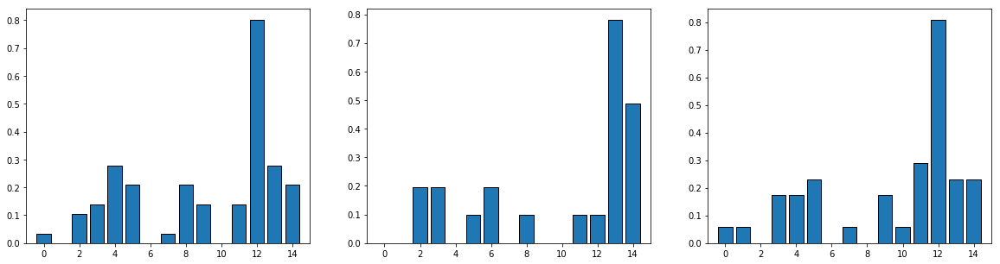

In [35]:
h_train, gmm_clf = BoW(radii_train[7], K, None)

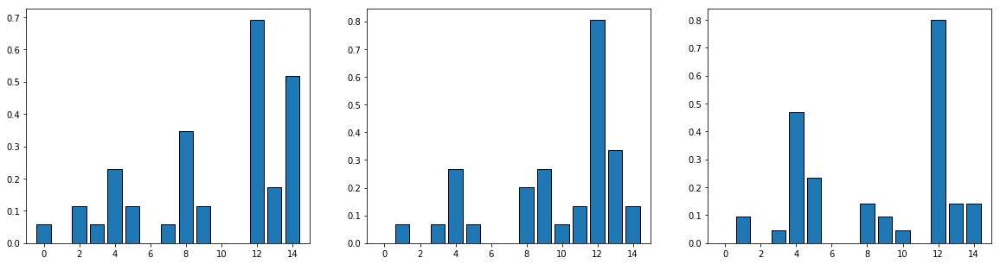

In [36]:
h_test, _ = BoW(radii_test[7], K, gmm_clf)

In [37]:
identities7 = get_identities(h_test, h_train)

In [38]:
rate_7, true_ids7 = calculate_recog_rate(identities7)

Recoginition Rate: 27.143%


### Radius = 12

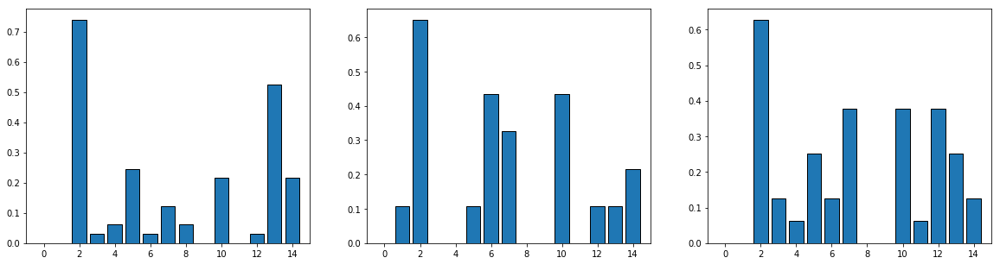

In [39]:
h_train, gmm_clf = BoW(radii_train[12], K, None)

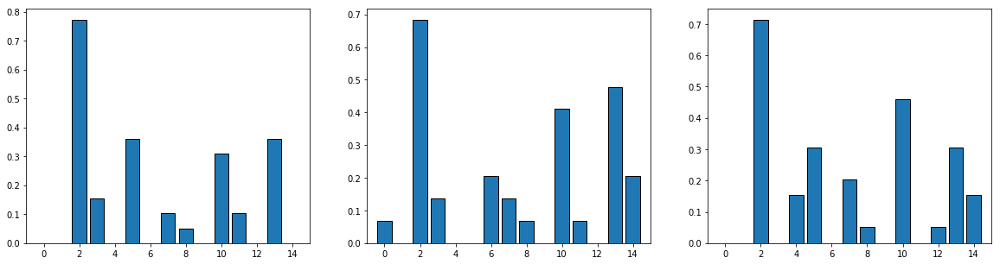

In [40]:
h_test, _ = BoW(radii_test[12], K, gmm_clf)

In [41]:
identities12 = get_identities(h_test, h_train)

In [42]:
rate_12, true_ids12 = calculate_recog_rate(identities12)

Recoginition Rate: 28.571%


### Plot recognition rate (on y-axis) vs patch size (on x-axis). Compute confusion matrix for the best performing vocabulary.

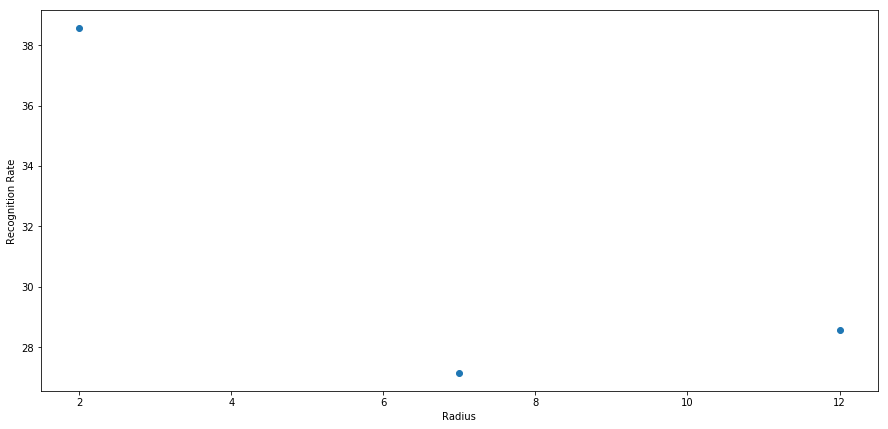

In [43]:
plt.figure(figsize=(15,7))
plt.scatter([2,7,12], [rate_2, rate_7, rate_12])
plt.ylabel('Recognition Rate')
plt.xlabel('Radius')
plt.show()

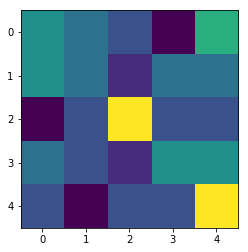

In [44]:
rates = [rate_2, rate_7, rate_12]
index = np.argmax(rates)
y_test = [true_ids2, true_ids7, true_ids12]
y_pred = [identities2, identities7, identities12]
plt.imshow(confusion_matrix(y_test[index], y_pred[index]))
plt.show()

# 4.3 Experiment 2: Patch Sizes

Best performing was LBP with radius=2 at 38.5% Recognition rate

## patch_size = 5x5

In [45]:
radii_train = {2: None}
radii_test = {2: None}
get_features(training, testing, radii_train, radii_test, extractor = 'LBP', patch_size=5)

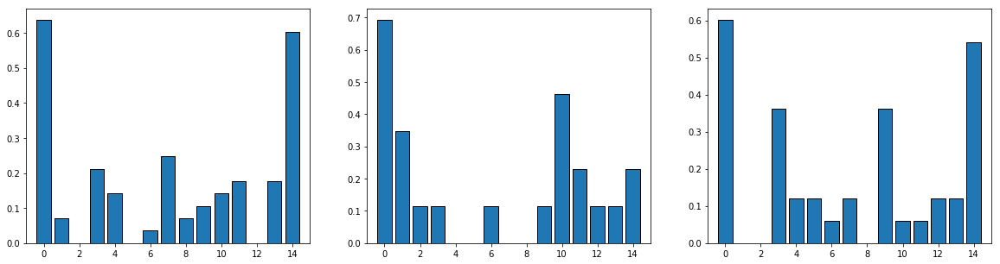

In [46]:
h_train, gmm_clf = BoW(radii_train[2], K, None)

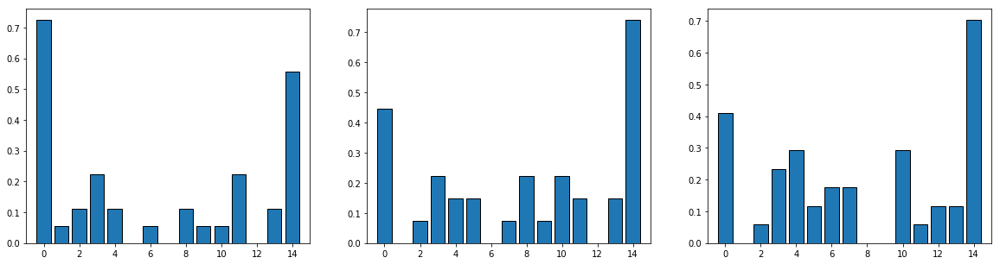

In [47]:
h_test, _ = BoW(radii_test[2], K, gmm_clf)

In [48]:
identities_patch5 = get_identities(h_test, h_train)

In [49]:
rate_patch5, true_ids_patch5 = calculate_recog_rate(identities_patch5)

Recoginition Rate: 17.143%


## patch_size = 15x15

In [50]:
radii_train = {2: None}
radii_test = {2: None}
get_features(training, testing, radii_train, radii_test, extractor = 'LBP', patch_size=15)

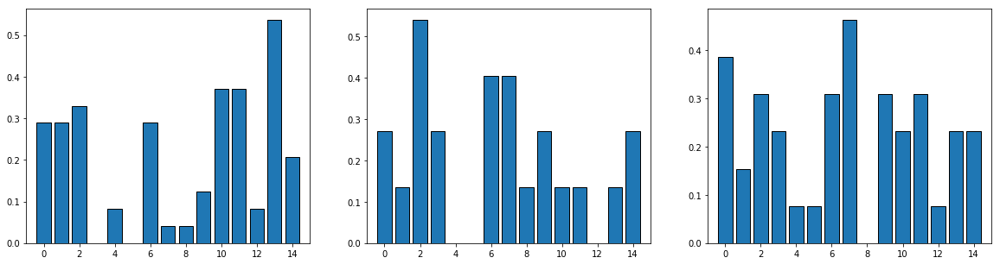

In [51]:
h_train, gmm_clf = BoW(radii_train[2], K, None)

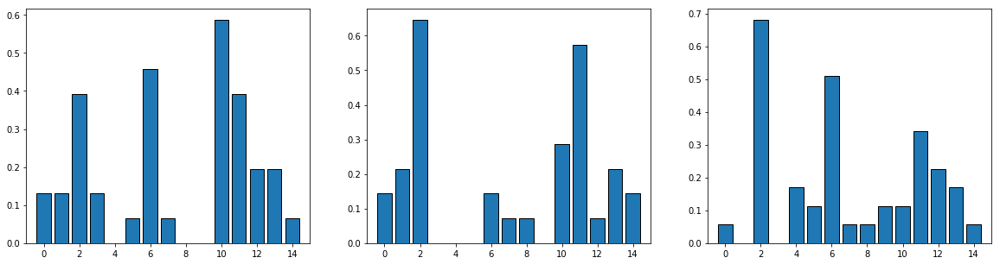

In [52]:
h_test, _ = BoW(radii_test[2], K, gmm_clf)

In [53]:
identities_patch15 = get_identities(h_test, h_train)

In [54]:
rate_patch15, true_ids_patch15 = calculate_recog_rate(identities_patch15)

Recoginition Rate: 38.571%


### patch_size = 25x25

In [55]:
radii_train = {2: None}
radii_test = {2: None}
get_features(training, testing, radii_train, radii_test, extractor = 'LBP', patch_size=25)

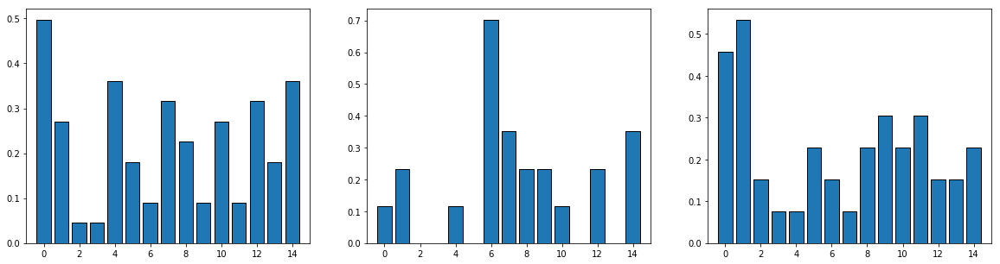

In [56]:
h_train, gmm_clf = BoW(radii_train[2], K, None)

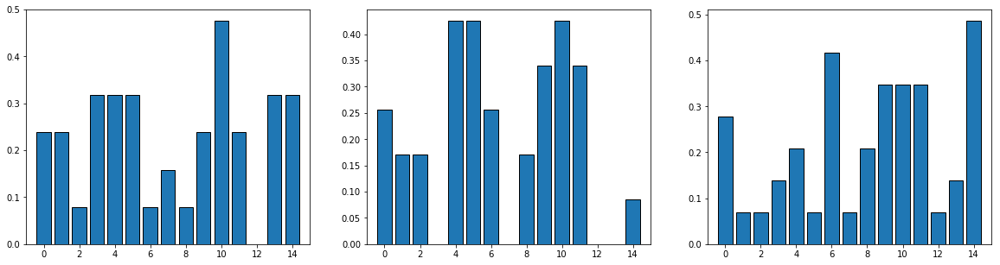

In [57]:
h_test, _ = BoW(radii_test[2], K, gmm_clf)

In [58]:
identities_patch25 = get_identities(h_test, h_train)

In [59]:
rate_patch25, true_ids_patch25 = calculate_recog_rate(identities_patch25)

Recoginition Rate: 21.429%


### Plot recognition rate (on y-axis) vs patch size (on x-axis). Compute confusion matrix for the best performing vocabulary.

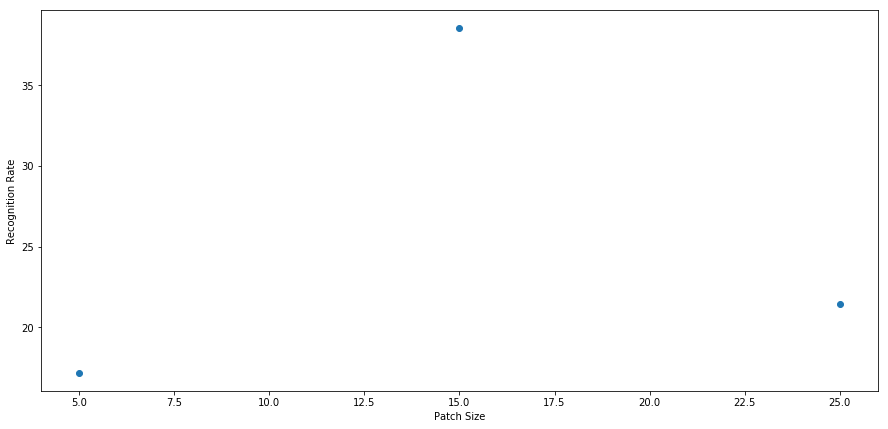

In [74]:
plt.figure(figsize=(15,7))
plt.scatter([5,15,25], [rate_patch5, rate_patch15, rate_patch25])
plt.ylabel('Recognition Rate')
plt.xlabel('Patch Size')
plt.show()

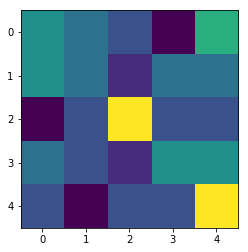

In [61]:
rates = [rate_patch5, rate_patch15, rate_patch25]
index = np.argmax(rates)
y_test = [true_ids_patch5, true_ids_patch15, true_ids_patch25]
y_pred = [identities_patch5, identities_patch15, identities_patch25]
plt.imshow(confusion_matrix(y_test[index], y_pred[index]))
plt.show()

## 4.3 Experiment 3: Harris Corners

In [62]:
def corner_feats(imgs_dict, draw = True):
  
    images = imgs_dict["images"]
    bounds = imgs_dict["bounds"]
    
    num_imgs_per_person = int(len(images)/5)

    corner_pts = []

    if(draw):
        plt.figure(figsize=(20, 70))
    
    for i, img in enumerate(images):

        img_disp = img.copy()
        
        img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # cv2.cornerHarris(src, neighborhoodsize, sobelKernelSize, Harris_k)
        corners = cv2.cornerHarris(img_gray, 2, 7, 0.00005)
            
        cv2.normalize(corners, corners, 0, 1, cv2.NORM_MINMAX)

        # threshold for an optimal value
        thres = 0.08
        
        loc = np.where(corners >= thres)
            
        corners_filtered = []
        for pt in zip(*loc[::-1]):
            point = pt;
            if(point[0] > bounds[i]["min_x"] + 3 and 
               point[0] < bounds[i]["max_x"] - 3 and 
               point[1] > bounds[i]["min_y"] + 3 and 
               point[1] < bounds[i]["max_y"] - 3):
                corners_filtered.append(point)
                cv2.drawMarker(img_disp, pt, (255,0,0), markerType = cv2.MARKER_CROSS, markerSize = 2, thickness = 2)

        corner_pts.append(corners_filtered)
        
        if(draw):
            # display images
            plt.subplot(num_imgs_per_person, 5, (math.floor(i/num_imgs_per_person) + 1 + 5 * (i % num_imgs_per_person)))
            plt.imshow(img_disp)

    
    plt.show()
    
    return corner_pts

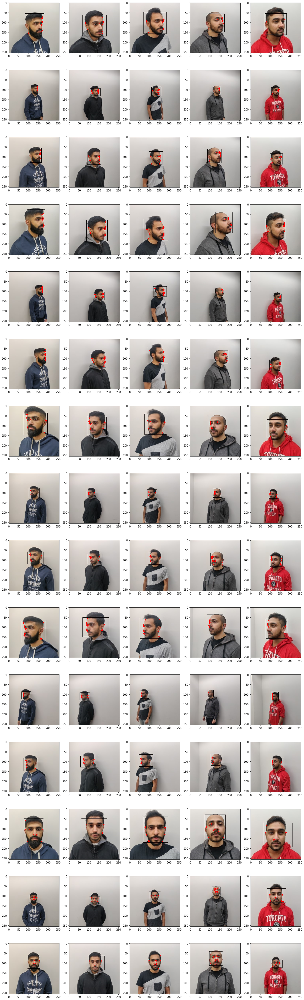

In [63]:
training['harris corners'] = corner_feats(training)

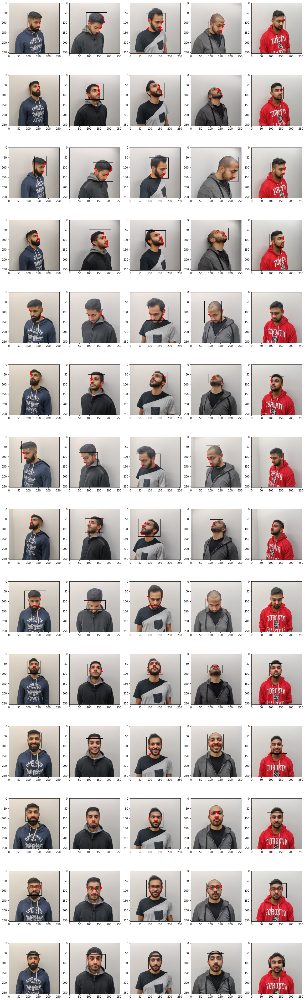

In [64]:
testing['harris corners'] = corner_feats(testing)

In [65]:
radii_train = {2: None}
radii_test = {2: None}

get_features(training, testing, radii_train, radii_test, feature = 'harris corners', extractor = 'LBP')

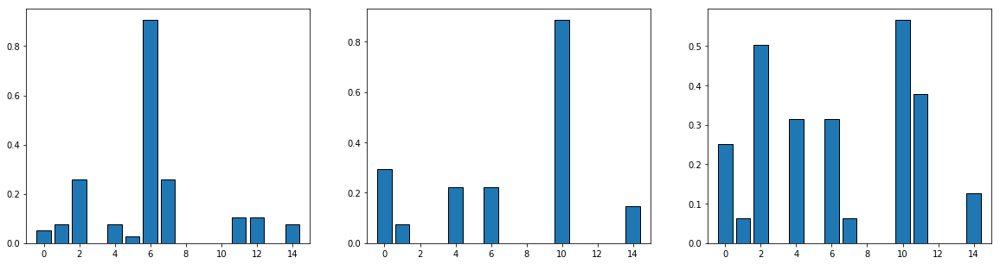

In [66]:
h_train, gmm_clf = BoW(radii_train[2], K, None)

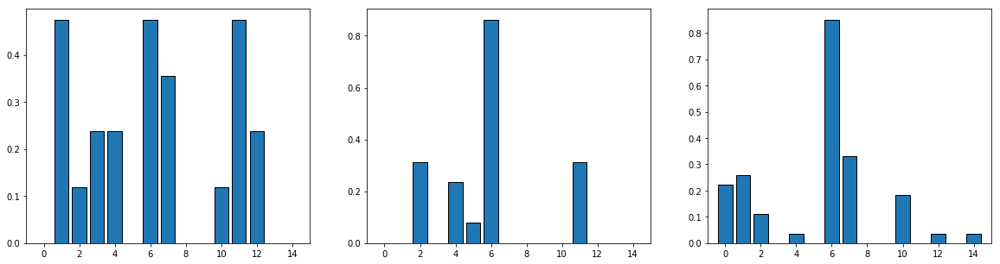

In [67]:
h_test, _ = BoW(radii_test[2], K, gmm_clf)

In [70]:
identities_harris = get_identities(h_test, h_train)

In [71]:
rate_harris, true_ids_harris = calculate_recog_rate(identities_harris)

Recoginition Rate: 34.286%


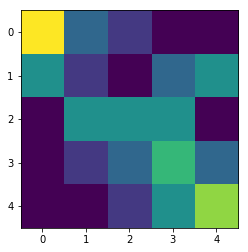

In [72]:
plt.imshow(confusion_matrix(true_ids_harris, identities_harris))
plt.show()